In [1]:
%matplotlib widget
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets
import pandas as pd
from functions import *

In [2]:
def plot_function(data_to_plot, title):
    
    def plotimg(idx):
        # Update histogram
        ax[0].clear()
        ax[0].hist(data_to_plot[int(idx)].flatten(), bins = len(np.unique(data_to_plot[int(idx)].flatten())))
        # Update image
        img.set_data(data_to_plot[int(idx),:,:])
        im = ax[1].imshow(data_to_plot[int(idx),:,:], origin='lower', cmap = 'viridis')
        ax[0].axvline(np.nanmedian(data_to_plot[int(idx),:,:]), c = 'r',  alpha = 0.5) # median pixel value
        ax[0].axvline(np.nanmean(data_to_plot[int(idx),:,:]), c = 'g', alpha = 0.5) # mean pixel value
        #plt.colorbar(im)
        fig.canvas.draw_idle()
        
    fig, ax = plt.subplots(ncols = 2, figsize=(12,4))
    img = ax[1].imshow(data_to_plot[0], origin='lower')
    #colorbar = plt.colorbar(img)
    ax[0].set_xlabel('Brightness')
    ax[0].set_ylabel('Nb of pixels')
    plt.suptitle(title, weight = 'bold')

    ipywidgets.interact(plotimg, idx = ipywidgets.FloatSlider(value=0,min=0,max=np.shape(data_to_plot)[0]-1,step=1))
    plt.show()

# Main loop of entire process

In [3]:
   
def main_loop(Imagettes, Attitude, threshold_mask, threshold_cosmics):

    ### Get imagettes and plot ###
    type_of_visit = 'science'
    imagettes, header_Imagettes, metadata_Imagettes, nb_imagettes, height_imagettes, width_imagettes = read_imagettes(Imagettes, type_of_visit)
    or_id =  str(header_Imagettes['REQ_ID']) + '_' + str(header_Imagettes['VISITCTR'])
    visit_start = header_Imagettes['T_STRT_U']
    visit_end = header_Imagettes['T_STOP_U']
    total_exp_time = header_Imagettes['TEXPTIME']
    print(f"{header_Imagettes['TARGNAME']} (PR340102, OR {or_id}): {visit_start}, {np.shape(imagettes)[0]} imagettes.")
    
    ## WORKING WITH SUBARRAYS ####
    
    size = np.shape(imagettes[0])[0]
    radius = np.shape(imagettes[0])[0]/2
    mask_circular = create_circular_mask(size, radius)
    # Apply mask to subarrays
    imagettes = apply_mask_to_imagettes(imagettes, mask_circular, 0)
    ################################
    
    ### Get mask of edges for later ###
    edges_mask = get_edges_mask(imagettes[0])

    ### Subtract the median image ###
    median_substracted_imagettes = subtract_median_image(imagettes)

    ### Convert to openCV images ###
    openCV_imagettes = convert_to_openCV(median_substracted_imagettes, nb_imagettes, height_imagettes, width_imagettes)

    ### Derotate images ###
    derotated_openCV_imagettes, time_imagettes_utc, time_imagettes_utc_jd = derotate_images(Attitude, openCV_imagettes, metadata_Imagettes, nb_imagettes, height_imagettes, width_imagettes)

    ### Design mask for contaminant ###
    enlarge_mask = True
    inspect_threshold = True
    inspect_mask = True

    mask = create_contaminant_mask(derotated_openCV_imagettes, threshold_mask, edges_mask, enlarge_mask, inspect_threshold, inspect_mask)

    ### Apply mask ###
    masked_imagettes = apply_mask_to_imagettes(derotated_openCV_imagettes, mask, 0)

    ### Detect cosmics ###
    binary_images, nb_cosmics, imagettes_contours = detect_cosmics(masked_imagettes, threshold_cosmics) 
    
    # Cosmic per cm2
    nb_masked_pixels = np.sum(edges_mask.flatten()) + np.sum(mask.flatten()) # number of pixels that are masked (edged + mask)
    fraction_remaining_pixels = (height_imagettes*width_imagettes) - nb_masked_pixels
    pixel_size = 13e-6 # m
    cm2_analysed = fraction_remaining_pixels*((pixel_size*1e2)**2) # cm2
    density_cosmics = nb_cosmics/cm2_analysed/total_exp_time # nb cosmics/cm2/sec
    
    print(f'{nb_masked_pixels} masked pixels')
    
    flattened_imagettes           = [image.flatten() for image in imagettes]
    flattened_derotated_imagettes = [image.flatten() for image in derotated_openCV_imagettes]
    flattened_masked_imagettes    = [image.flatten() for image in masked_imagettes]
    flattened_binary_imagettes    = [image.flatten() for image in binary_images]
    
    flattened_mask = []
    for i in range(len(imagettes)):
        flattened_mask.append(mask.flatten())
    
    #MJD_time = time_imagette+2400000
    
    ###### If working with subArrays, we can directly retrieve LAT/LON from the metadata
    latitude = [metadata['LATITUDE'] for metadata in metadata_Imagettes]
    longitude = [metadata['LONGITUDE'] for metadata in metadata_Imagettes]


    data = pd.DataFrame(data =    {
                                'visit_ID': np.full(nb_imagettes, or_id),
                                'raw_imagettes': flattened_imagettes,
                                'derotated_imagettes': flattened_derotated_imagettes,
                                'masked_imagettes': flattened_masked_imagettes, 
                                'binary_imagettes': flattened_binary_imagettes, 
                                'mask': flattened_mask,
                                'JD': time_imagettes_utc_jd,
                                'time': time_imagettes_utc,
                                'nb_cosmics' : nb_cosmics.astype(int),
                                'density_cosmics' : density_cosmics,
                                'pix_cosmics': imagettes_contours,
                                'im_height': np.full(nb_imagettes, height_imagettes),
                                'im_width': np.full(nb_imagettes, width_imagettes),
                                'LATITUDE': latitude,
                                'LONGITUDE': longitude
                                }
    )
    
    data.set_index('JD',drop = True, inplace = True) # set index to JD
    
    ##### IF NOT 
    
    # data = pd.DataFrame(data =    {
    #                             'visit_ID': np.full(nb_imagettes, or_id),
    #                             'raw_imagettes': flattened_imagettes,
    #                             'derotated_imagettes': flattened_derotated_imagettes,
    #                             'masked_imagettes': flattened_masked_imagettes, 
    #                             'binary_imagettes': flattened_binary_imagettes, 
    #                             'mask': flattened_mask,
    #                             'JD': time_imagettes_utc_jd,
    #                             'time': time_imagettes_utc,
    #                             'nb_cosmics' : nb_cosmics.astype(int),
    #                             'density_cosmics' : density_cosmics,
    #                             'pix_cosmics': imagettes_contours,
    #                             'im_height': np.full(nb_imagettes, height_imagettes),
    #                             'im_width': np.full(nb_imagettes, width_imagettes)
    #                             }
    # )
    
    # data.set_index('JD',drop = True, inplace = True) # set index to JD

    ### Crossmathc with LAT/LON from the restituted orbit ###
    
    #### TO DO #####
    # once the code is on the compute node, fetch directly the res orb files and compute the master orb res file
    # in the meantime:
    # - go on cn04 and compute the most recent master_orb_res using the MC_SAA_script.py in /home/astro/heitzman/SAA_mapping/SAA_OR
    # - run: scp cn04:/home/astro/heitzman/SAA_mapping/master_orb_res.csv /Users/alexisheitzmann/Documents/CHEOPS/Code/SAA_monitoring_MC/SAA_ORs_reduction_pipeline/

    
    # ###############
    # # get restituted orbit master file
    data_res_orb = pd.read_csv('/home/lui/Documents/thesis/CheopsCosmics/Luise/master_orb_res.csv')
    data_res_orb.set_index('JD',drop = True, inplace = True) # set index to JD
    data_res_orb.sort_index()
    data_RES = data_res_orb.copy()
    # Use only the part of the restitued around the visit, +/- 1 day to have enough baseline for the interpolation
    time_min = data.index.min() - 1
    time_max = data.index.max() + 1
    data_RES = data_RES[(data_RES.index > time_min) & (data_RES.index < time_max)]
    # Interpolate LAT/LON at the time of the imagettes
    data = unfold_interp_fold(data_RES, data, order = 3)
    

    
    return data, data_res_orb

SAA_evening_May (PR340102, OR 11_1): 2024-05-15T19:27:53.467581, 56 imagettes.


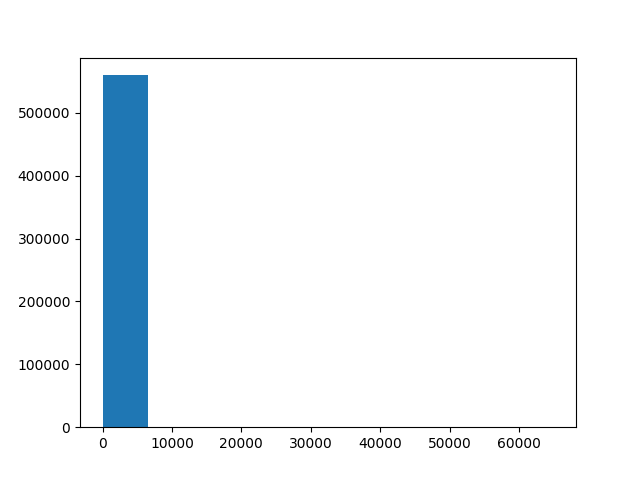

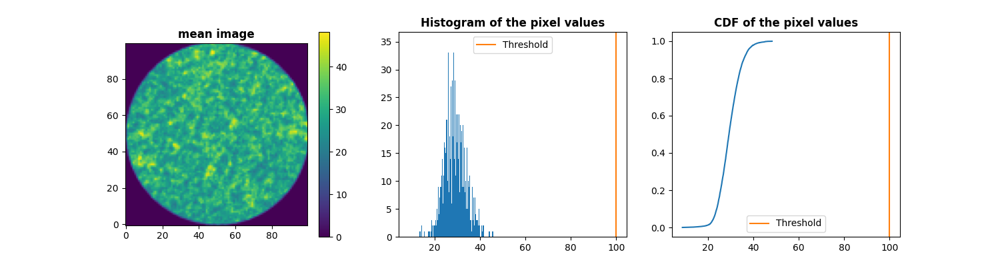

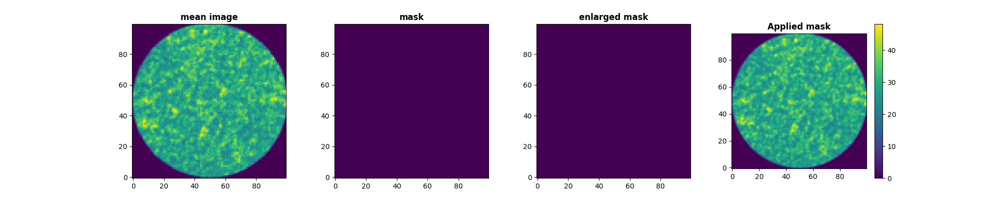

2157 masked pixels


"\nall_data = pd.DataFrame()\nrestituted_orbit = pd.DataFrame()\nfor i in range(len(Imagettes)):\n    visit = Imagettes[i].split('/')[8][3:20] #had to change this from 9 to 8 -> otherwise index error -> depending on number of input folders\n    print(f'Processing visit {visit}...')\n    df, _ = main_loop(Imagettes[i], Attitudes[i], threshold_mask, threshold_cosmics)\n    if i == (len(Imagettes))-1:\n        df, restituted_orbit = main_loop(Imagettes[i], Attitudes[i], threshold_mask, threshold_cosmics)\n    all_data = pd.concat([all_data, df], ignore_index=False)\n    #restituted_orbit = pd.concat([restituted_orbit, data_RES], ignore_index=False)\n    \nrestituted_orbit = restituted_orbit.sort_index()    \nall_data = all_data.sort_index()\n"

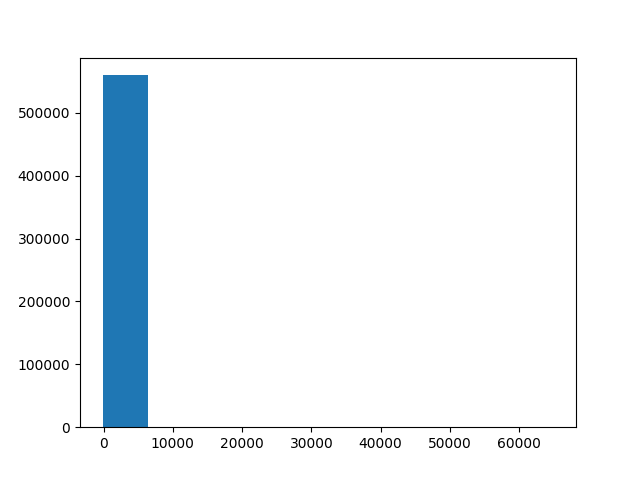

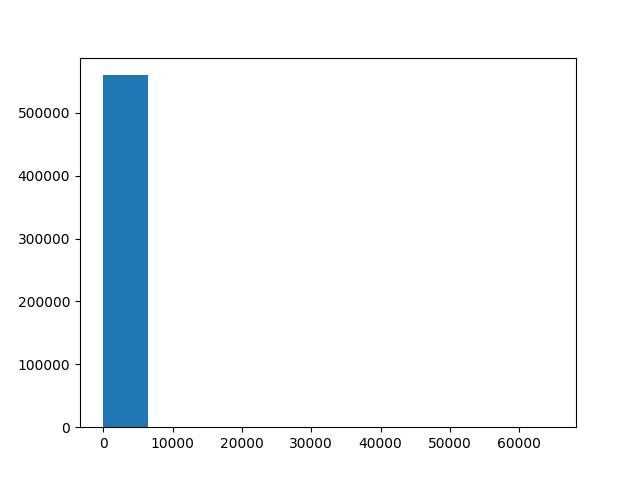

In [4]:
# get list of files

# for local run, get the imagettes and attitude files
# scp cn:"/projects/astro/cheops/processing/chpscn02/opt/monitor4cheops/Operations/repository/visit/PR34/PR340102_TG00*/*Imagette*" SAA_ORs_reduction_pipeline/SAA_visits
# scp cn:"/projects/astro/cheops/processing/chpscn02/opt/monitor4cheops/Operations/repository/visit/PR34/PR340102_TG00*/*Attitude*" SAA_ORs_reduction_pipeline/SAA_visits


directory_path = '/home/lui/Documents/thesis/CheopsCosmics/Luise/SAA_visits'
substring = 'RAW_SubArray'
Imagettes = get_files_with_substring(directory_path, substring)
Imagettes.sort()

directory_path = '/home/lui/Documents/thesis/CheopsCosmics/Luise/SAA_visits'
substring = 'RAW_Attitude'
Attitudes = get_files_with_substring(directory_path, substring)
Attitudes.sort()

# Run main loop 

threshold_mask = 100
threshold_cosmics = 100

# For a single visit

visit_idx = 5
all_data, restituted_orbit = main_loop(Imagettes[visit_idx], Attitudes[visit_idx], threshold_mask, threshold_cosmics)


# For all visits
'''
all_data = pd.DataFrame()
restituted_orbit = pd.DataFrame()
for i in range(len(Imagettes)):
    visit = Imagettes[i].split('/')[8][3:20] #had to change this from 9 to 8 -> otherwise index error -> depending on number of input folders
    print(f'Processing visit {visit}...')
    df, _ = main_loop(Imagettes[i], Attitudes[i], threshold_mask, threshold_cosmics)
    if i == (len(Imagettes))-1:
        df, restituted_orbit = main_loop(Imagettes[i], Attitudes[i], threshold_mask, threshold_cosmics)
    all_data = pd.concat([all_data, df], ignore_index=False)
    #restituted_orbit = pd.concat([restituted_orbit, data_RES], ignore_index=False)
    
restituted_orbit = restituted_orbit.sort_index()    
all_data = all_data.sort_index()
'''

# Detections

In [5]:
detections = all_data[all_data['nb_cosmics'] != 0]
max_cosmics = np.max(detections['nb_cosmics'])
print(f'Frame with most cosmics has {max_cosmics} cosmics')

non_detections = all_data[all_data['nb_cosmics'] == 0]

Frame with most cosmics has 160 cosmics


interactive(children=(FloatSlider(value=0.0, description='idx', max=801.0, step=1.0), Output()), _dom_classes=…

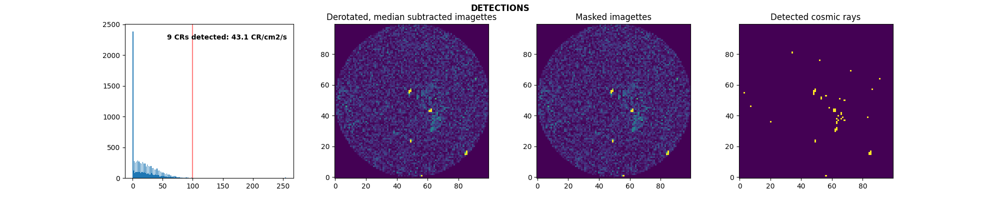

In [6]:
data_to_plot1 = reshape_flatten_images('derotated_imagettes', detections) 
data_to_plot2 = reshape_flatten_images('masked_imagettes', detections) 
data_to_plot3 = reshape_flatten_images('binary_imagettes', detections) 
cosmics = detections['nb_cosmics'].values
density_cosmics = detections['density_cosmics'].values

def plotimg(idx):
    
    # Update histogram
    ax[0].clear()
    ax[0].hist(data_to_plot1[int(idx)].flatten(), bins = int(np.max(data_to_plot1[int(idx)].flatten())))
    #ax[0].set_xlim(1,np.max(data_to_plot[int(idx)].flatten()))
    # Update image
    img1.set_data(data_to_plot1[int(idx)])
    img2.set_data(data_to_plot2[int(idx)])
    img3.set_data(data_to_plot3[int(idx)])
    ax[1].imshow(data_to_plot1[int(idx)], origin='lower', cmap = 'viridis')
    ax[2].imshow(data_to_plot2[int(idx)], origin='lower', cmap = 'viridis')
    ax[3].imshow(data_to_plot3[int(idx)], origin='lower', cmap = 'viridis')
    ax[0].axvline(threshold_cosmics, c = 'r',  alpha = 0.5) # median pixel value
    ax[0].text(0.25,0.9,f'{int(cosmics[int(idx)])} CRs detected: {np.round(density_cosmics[int(idx)],1)} CR/cm2/s', weight = 'bold', transform=ax[0].transAxes)
    #plt.colorbar(im)
    fig.canvas.draw_idle()
    
fig, ax = plt.subplots(ncols = 4, figsize=(20,4))
img1 = ax[1].imshow(data_to_plot1[0], origin='lower')
ax[1].set_title('Derotated, median subtracted imagettes')
img2 = ax[2].imshow(data_to_plot2[0], origin='lower')
ax[2].set_title('Masked imagettes')
img3 = ax[3].imshow(data_to_plot3[0], origin='lower')
ax[3].set_title('Detected cosmic rays')
#colorbar = plt.colorbar(img)
ax[0].set_xlabel('Brightness')
ax[0].set_ylabel('Nb of pixels')

fig.suptitle('DETECTIONS', weight = 'bold')
ipywidgets.interact(plotimg, idx = ipywidgets.FloatSlider(value=0,min=0,max=np.shape(data_to_plot1)[0]-1,step=1))
plt.show()

# Non detections

interactive(children=(FloatSlider(value=0.0, description='idx', max=193.0, step=1.0), Output()), _dom_classes=…

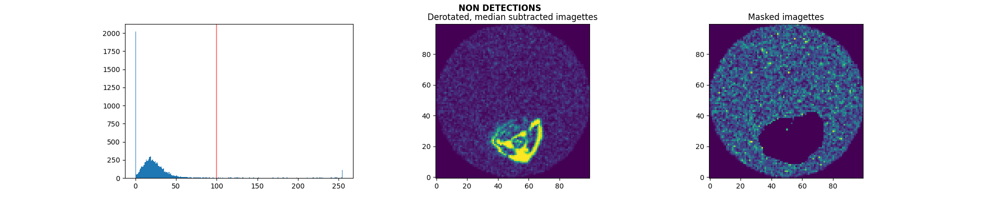

In [7]:
data_to_plot1 = reshape_flatten_images('derotated_imagettes', non_detections) 
data_to_plot2 = reshape_flatten_images('masked_imagettes', non_detections) 
data_to_plot3 = reshape_flatten_images('binary_imagettes', non_detections) 
cosmics = non_detections['nb_cosmics'].values
cosmics_density = non_detections['density_cosmics'].values

def plotimg(idx):
    
    # Update histogram
    ax[0].clear()
    ax[0].hist(data_to_plot1[int(idx)].flatten(), bins = int(np.max(data_to_plot1[int(idx)].flatten())))
    #ax[0].set_xlim(1,np.max(data_to_plot[int(idx)].flatten()))
    # Update image
    img1.set_data(data_to_plot1[int(idx)])
    img2.set_data(data_to_plot2[int(idx)])
    #img3.set_data(data_to_plot3[int(idx)])
    ax[1].imshow(data_to_plot1[int(idx)], origin='lower', cmap = 'viridis')
    ax[2].imshow(data_to_plot2[int(idx)], origin='lower', cmap = 'viridis')
    #ax[3].imshow(data_to_plot3[int(idx)], origin='lower', cmap = 'viridis')
    ax[0].axvline(threshold_cosmics, c = 'r',  alpha = 0.5) # median pixel value
    #plt.colorbar(im)
    fig.canvas.draw_idle()
    
fig, ax = plt.subplots(ncols = 3, figsize=(20,4))
img1 = ax[1].imshow(data_to_plot1[0], origin='lower')
ax[1].set_title('Derotated, median subtracted imagettes')
img2 = ax[2].imshow(data_to_plot2[0], origin='lower')
ax[2].set_title('Masked imagettes')
#img3 = ax[3].imshow(data_to_plot3[0], origin='lower')
#ax[3].set_title('Detected cosmic rays')
#colorbar = plt.colorbar(img)
ax[0].set_xlabel('Brightness')
ax[0].set_ylabel('Nb of pixels')

fig.suptitle('NON DETECTIONS', weight = 'bold')
ipywidgets.interact(plotimg, idx = ipywidgets.FloatSlider(value=0,min=0,max=np.shape(data_to_plot1)[0]-1,step=1))
plt.show()

# Inspect latitude and longitude

Text(0.5, 1.0, 'LONGITUDE')

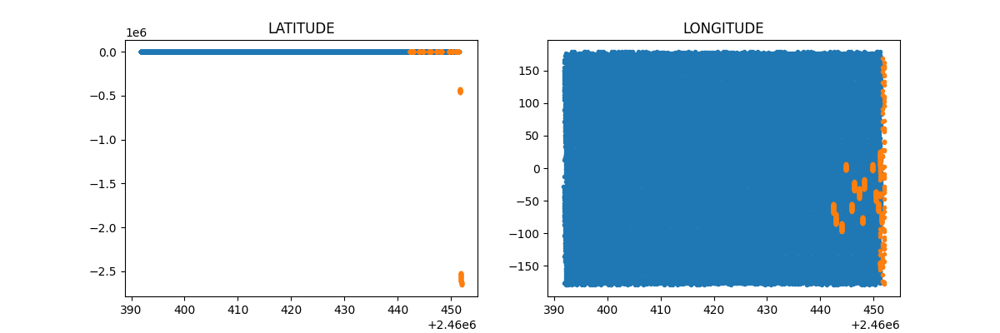

In [8]:
fig, ax = plt.subplots(ncols = 2, figsize=(12,4))
ax[0].plot(restituted_orbit.index,restituted_orbit['LATITUDE'], '.', label = 'restituted orbit')
ax[0].plot(detections.index,detections['LATITUDE'], '.', label = 'imagettes')
ax[0].set_title('LATITUDE')
ax[1].plot(restituted_orbit.index,restituted_orbit['LONGITUDE'], '.', label = 'restituted orbit')
ax[1].plot(detections.index,detections['LONGITUDE'], '.', label = 'imagettes')
ax[1].set_title('LONGITUDE')

# MAP

In [9]:
import cartopy.crs as ccrs
import matplotlib
from astropy.io import fits
from matplotlib.colors import ListedColormap
import numpy as np
import pandas as pd

In [10]:
# Read SAA mask
SAA_file = '/home/lui/Documents/thesis/CheopsCosmics/Luise/CH_TU2024-01-16T15-06-00_EXT_APP_SAAMap-690km_V0301.fits'
data_SAA = read_SAA_map(SAA_file)

Text(0.5, 1.0, 'Cosmic Rays counts (per imagette)')

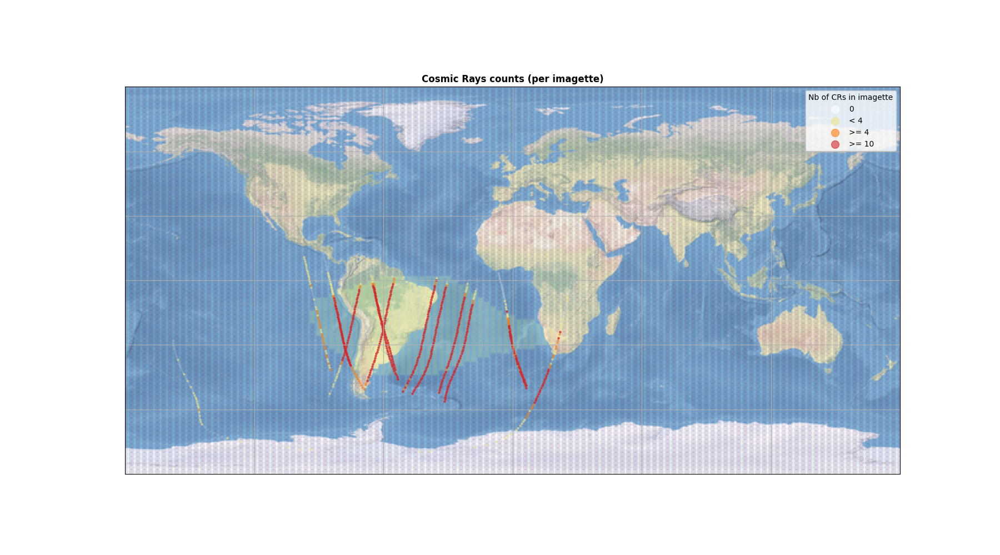

In [11]:
#%matplotlib widget
plt.close('all')
fig = plt.figure(figsize=(18, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
#ax = plt.axes(projection=ccrs.Orthographic(-45, -23))
ax.stock_img()
ax.gridlines()


data_plot = all_data


# Plot SAA mask
x = data_SAA['longitude']
y = data_SAA['latitude']
c = data_SAA['SAA_FLAG']
cc = plt.scatter(x,y,c = c, s = 50, alpha = 0.1, marker = 'o', edgecolor='none', transform=ccrs.Geodetic())


# x = data_plot['LONGITUDE']
# y = data_plot['LATITUDE']
# c = np.log(data_plot['density_cosmics'])

# cr = plt.scatter(x,y,c = c, s = 20, alpha = 0.5, marker = '.', transform=ccrs.Geodetic())#, label = labels[i])
# plt.colorbar(cr)
 

labels = ['0','< 4','>= 4', '>= 10']
colors = ['white','khaki','C1','C3']
cm = ListedColormap(colors)
for i in range(4):
    if i == 0:
        x = data_plot.loc[data_plot['nb_cosmics'] == 0]['LONGITUDE']
        y = data_plot.loc[data_plot['nb_cosmics'] == 0]['LATITUDE']
        alpha = 0.1
        
    if i == 1:
        x = data_plot.loc[(data_plot['nb_cosmics'] > 0) & (data_plot['nb_cosmics'] < 4)]['LONGITUDE']
        y = data_plot.loc[(data_plot['nb_cosmics'] > 0) & (data_plot['nb_cosmics'] < 4)]['LATITUDE']
        alpha = 0.5
        
    if i == 2:
        x = data_plot.loc[(data_plot['nb_cosmics'] >= 4) & (data_plot['nb_cosmics'] < 10)]['LONGITUDE']
        y = data_plot.loc[(data_plot['nb_cosmics'] >= 4) & (data_plot['nb_cosmics'] < 10)]['LATITUDE']
        alpha = 0.5
        
    if i == 3:
        x = data_plot.loc[data_plot['nb_cosmics'] >= 10]['LONGITUDE']
        y = data_plot.loc[data_plot['nb_cosmics'] >= 10]['LATITUDE']
        alpha = 0.7
    
    cr = plt.scatter(x,y,c = colors[i], s = 20, alpha = alpha, marker = '.', transform=ccrs.Geodetic(), label = labels[i])

handles = [
    plt.scatter([], [], s=100, c=colors[0], alpha=0.6, label=labels[0]),
    plt.scatter([], [], s=100, c=colors[1], alpha=0.6, label=labels[1]),
    plt.scatter([], [], s=100, c=colors[2], alpha=0.6, label=labels[2]),
    plt.scatter([], [], s=100, c=colors[3], alpha=0.6, label=labels[3]),

]

# Add legend to the plot with custom background color
legend = plt.legend(handles=handles, title='Nb of CRs in imagette')
legend.get_frame().set_facecolor('white')    
    
#     cm = ListedColormap(colors)
#     c = data_plot['multi_CRs']
#     plt.colorbar(cr)    
    
# x = data_plot['LONGITUDE']
# y = data_plot['LATITUDE']
# c = data_plot['nb_cosmics']
# cr = plt.scatter(x,y,c = c, alpha = 1, marker = '.', transform=ccrs.Geodetic())
# plt.colorbar(cr)

#labels = ['1 CR','multiple CR']
#colors = ['lightgrey', 'indianred']
# for i, value in enumerate([0,1]):
    # x = data_plot.loc[data_plot['multi_CRs'] == value]['LONGITUDE']
    # y = data_plot.loc[data_plot['multi_CRs'] == value]['LATITUDE']
    #cm = matplotlib.colormaps['tab10']
    #colors = ['lightgrey', 'indianred']
    #cm = ListedColormap(colors)
    #c = data_plot['multi_CRs']
    # plt.scatter(x,y,c = colors[i], s = 25, alpha = 1, marker = '.', transform=ccrs.Geodetic(), label = labels[i])
    #plt.colorbar(label='1 CR vs multiple CRs') 

# plt.legend(frameon=True,bbox_to_anchor=(0.12,0.6),markerscale=2)

# #plt.colorbar(aaa)
# #plt.title('June 28th, at 08:40:00, SAA_FLAG is False in MPS_PRE_VISIT')
# #plt.legend(frameon=True,bbox_to_anchor=(0.7,0),markerscale=1)
# #save_folder = '/Users/alexisheitzmann/Documents/CHEOPS/Code/SSA_mismapping/imagette_mapping/AU_Mic_5_sec_visits/'
# name_addition = 'all'
# save_name = 'map_CR_detections_'+ name_addition + '_' + np.min(full_orb_res_err.index).strftime("%Y-%m-%d") + '_to_' + np.max(full_orb_res_err.index).strftime("%Y-%m-%d") + '.png'
# title = str(len(data_plot)) + ' detections from ' + np.min(full_orb_res_err.index).strftime("%Y-%m-%d") + ' to ' + np.max(full_orb_res_err.index).strftime("%Y-%m-%d")
title = 'Cosmic Rays counts (per imagette)'
plt.title(title, weight = 'bold')
# plt.savefig(save_name, transparent = True, dpi = 600,format = 'png')
# #plt.show()

/usr/lib64/python3.12/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0.5, 1.0, 'Cosmic Rays density')

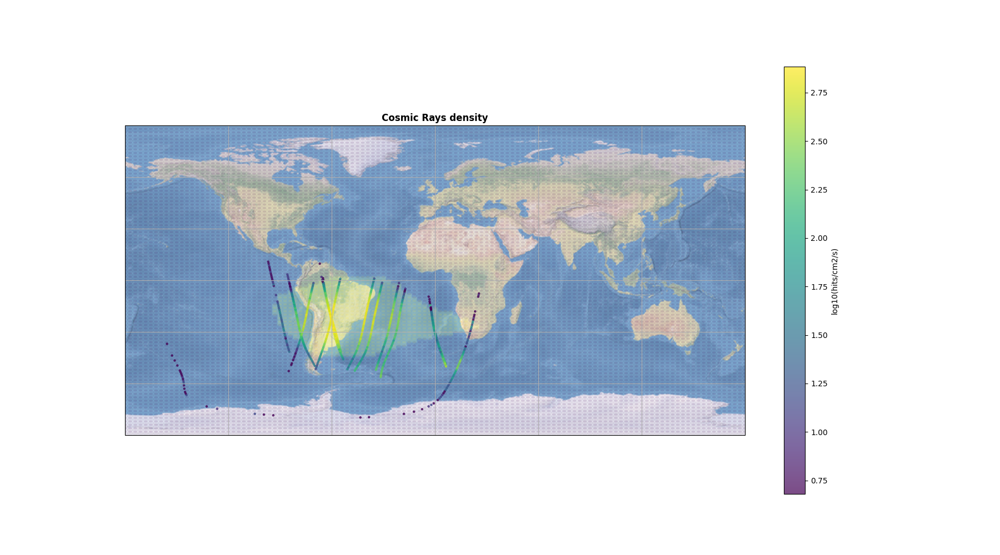

In [17]:
#%matplotlib widget
plt.close('all')
fig = plt.figure(figsize=(18, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
#ax = plt.axes(projection=ccrs.Orthographic(-45, -23))
ax.stock_img()
ax.gridlines()


data_plot = all_data


# Plot SAA mask
x = data_SAA['longitude']
y = data_SAA['latitude']
c = data_SAA['SAA_FLAG']
cc = plt.scatter(x,y,c = c, s = 50, alpha = 0.1, marker = 'o', edgecolor='none', transform=ccrs.Geodetic())


x = data_plot['LONGITUDE']
y = data_plot['LATITUDE']
c = np.log10(data_plot['density_cosmics'])

cr = plt.scatter(x,y,c = c, s = 5, alpha = 0.7, marker = 'o', transform=ccrs.Geodetic())#, label = labels[i])
plt.colorbar(cr, label = 'log10(hits/cm2/s)' )

# #plt.title('June 28th, at 08:40:00, SAA_FLAG is False in MPS_PRE_VISIT')
# #plt.legend(frameon=True,bbox_to_anchor=(0.7,0),markerscale=1)
# #save_folder = '/Users/alexisheitzmann/Documents/CHEOPS/Code/SSA_mismapping/imagette_mapping/AU_Mic_5_sec_visits/'
# name_addition = 'all'
# save_name = 'map_CR_detections_'+ name_addition + '_' + np.min(full_orb_res_err.index).strftime("%Y-%m-%d") + '_to_' + np.max(full_orb_res_err.index).strftime("%Y-%m-%d") + '.png'
#title = str(len(data_plot)) + ' detections from ' + np.min(full_orb_res_err.index).strftime("%Y-%m-%d") + ' to ' + np.max(full_orb_res_err.index).strftime("%Y-%m-%d")
title = 'Cosmic Rays density'
plt.title(title, weight = 'bold')
# plt.savefig(save_name, transparent = True, dpi = 600,format = 'png')
# #plt.show()

# BIN

Text(0.5, 1.0, 'Cosmic Rays density')

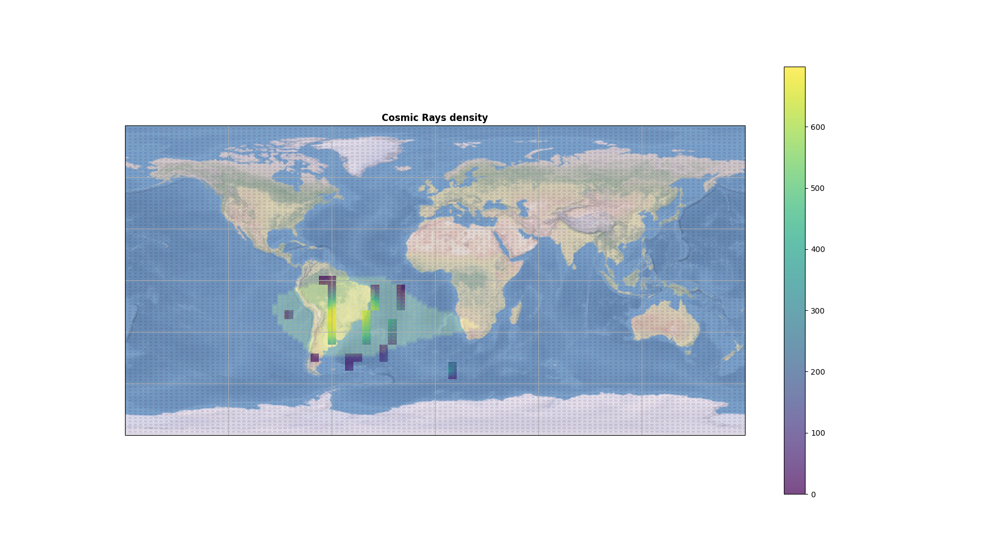

In [18]:
#%matplotlib widget
plt.close('all')
fig = plt.figure(figsize=(18, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
#ax = plt.axes(projection=ccrs.Orthographic(-45, -23))
ax.stock_img()
ax.gridlines()


data_plot = all_data


# Plot SAA mask
x = data_SAA['longitude']
y = data_SAA['latitude']
c = data_SAA['SAA_FLAG']
cc = plt.scatter(x,y,c = c, s = 50, alpha = 0.1, marker = 'o', edgecolor='none', transform=ccrs.Geodetic())


x = data_plot['LONGITUDE']
y = data_plot['LATITUDE']
c = data_plot['density_cosmics']

#cr = plt.scatter(x,y,c = c, s = 5, alpha = 0.7, marker = 'o', transform=ccrs.Geodetic())#, label = labels[i])
#plt.colorbar(cr)

from scipy.stats import binned_statistic_2d

x_bins = np.arange(-180, 180+1,5)
y_bins = np.arange(-90, 90+1,5)

ret = binned_statistic_2d(x, y, c, statistic='mean', bins=[x_bins, y_bins])

#plt.scatter(x, y, c=c)
aa = ax.imshow(ret.statistic.T, origin='lower', alpha = 0.7, extent=(-180, 180, -90, 90), interpolation='bilinear')
plt.colorbar(aa)

plt.title(title, weight = 'bold')
# plt.savefig(save_name, transparent = True, dpi = 600,format = 'png')
# #plt.show()

# TESTS

In [ ]:
median_imagette = np.nanmedian(reshaped_masked_imagettes, axis=(0)) # median

plt.figure()
plt.imshow(median_imagette)
plt.colorbar()
plt.show()
# unique_values = np.unique(median_imagette)
# if (len(unique_values) == 1) & (np.unique(unique_values[0]) == 0): # If the only value is 0 for all pixels of the image
#     image_for_mask = median_imagette
#     med_or_mean = 'median'

# TO DO/IMPLEMENT

- Give this to Andrea to work out the real time sampled by one exposure

time: 1.0 + 0.25 sec

exp time
read out mode
size of image + imagette
rep period 


- Recompute the 2 lines-element from X,Y,Z or POS/VEL to get better position on the mmap

- Check to consistency between MJD in the imagette and JD in the restituted orbit file
- Adapt the main loop to directly fetch the restituted orbit files and concatenate them once we have the script on the compute node
- To cicumvent the double identification of a cosmic for complex patterns, we can check whether a all pixels of a contours are also present in another, larger contour. If yes, we can remove the detections and the contour associated to the snaller list. To test and add as a condition when doing the contour detection
- Mean or median in different cases
- For subArrays in science images:
  - Remove the ones with straylight
  - Fit the noise? 